In [17]:
import os
import json
import ast

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy.stats import gaussian_kde
import plotly.graph_objects as go
import plotly.express as px

from collections.abc import Callable
from IPython.display import display

pd.set_option('display.max_rows', 200)

In [18]:
dataset_types = ["institutions", "institution_subnets", "ip_addresses_sample"]
metric_for_eval = "R2-SCORE"
column_subset = ["n_bytes", "n_flows", "n_packets"]

training_window_specific = 24
prediction_window_specific = 1

path = "./results/"

df_dict = {dt: pd.read_csv(os.path.join(path, f"results_{dt}.csv")) for dt in dataset_types}
models = list(df_dict["institutions"]["MODEL"].drop_duplicates())

### Cut off for metrics

In [19]:
for key, df in df_dict.items():
    df["R2-SCORE"] = df["R2-SCORE"].apply(lambda x: -10 if x < -10 or x > 10 else x)
    df = df[~df["R2-SCORE"].isna()]
    df_dict[key] = df

In [20]:
def do_for_all(df_dict: dict, func: Callable, *args, **kwargs):
    """
    Applies the given function `func` to every DataFrame in `df_dict`.
    Additional positional and keyword arguments can be passed through.
    
    Parameters
    ----------
    df_dict : dict
        Dictionary of DataFrames.
    func : callable
        A function that takes a DataFrame as the first argument.
    *args : tuple
        Any additional positional arguments for `func`.
    **kwargs : dict
        Any additional keyword arguments for `func`.
    
    Returns
    -------
    dict
        Dictionary of results, with the same keys as `df_dict`.
    """
    
    df_results = [] 
    for name, df in df_dict.items():
        result = func(df, *args, **kwargs)
        result = result.add_suffix(f"_{name}")
        df_results.append(result)
    combined_df = pd.concat(df_results, axis=1)
    display(combined_df)



### Compare models overall

In [21]:
do_for_all(
    df_dict,
    lambda df: df.groupby("MODEL")[[metric_for_eval]].mean()
)

,R2-SCORE_institutions,R2-SCORE_institution_subnets,R2-SCORE_ip_addresses_sample
MODEL,,,
ETSformer,-0.038197,-0.195743,-0.760654
GRU,-0.334000,-0.451172,-0.311717
GRU-FCN,-0.468312,-0.613341,-0.516525
InceptionTime,-2.891550,-3.122233,-4.146689
LSTM,-0.336562,-0.454926,-0.311447
LSTM-FCN,-0.564020,-0.697229,-0.466193
Mean,0.118336,0.134500,0.028975
RCLSTM,-1.490008,-1.540991,-0.514897
ResNet,-1.420439,-1.590197,-0.830040


### Compare training and prediction windows combinations

In [22]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["TRAINING_WINDOW", "PREDICTION_WINDOW"])[[metric_for_eval]].mean()
)

R2-SCORE_institutions  \
TRAINING_WINDOW PREDICTION_WINDOW                          
24              1                               0.195837   
                24                              0.571765   
168             1                               0.051736   
                24                             -1.515596   
                168                            -0.135968   
744             1                              -0.402900   
                168                            -2.453329   

                                   R2-SCORE_institution_subnets  \
TRAINING_WINDOW PREDICTION_WINDOW                                 
24              1                                      0.033463   
                24                                     0.532179   
168             1                                     -0.109727   
                24                                    -1.576690   
                168                                   -0.172306   
744             1                                     -0.541261   
                168                                   -2.540179   

                                   R2-SCORE_ip_addresses_sample  
TRAINING_WINDOW PREDICTION_WINDOW                                
24              1                                     -0.225156  
                24                                     0.286196  
168             1                                     -0.318761  
                24                                    -1.355057  
                168                                   -0.137486  
744             1                                     -0.563256  
                168                                   -1.852126

### Compare model, training and prediction windows combinations

In [23]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["MODEL", "TRAINING_WINDOW", "PREDICTION_WINDOW"])[[metric_for_eval]].mean()
)

R2-SCORE_institutions  \
MODEL         TRAINING_WINDOW PREDICTION_WINDOW                          
ETSformer     24              1                               0.255136   
              168             1                               0.405677   
                              24                             -0.252783   
              744             1                               0.458249   
                              168                            -1.057262   
GRU           24              1                               0.271643   
              168             1                               0.267923   
                              24                             -1.000124   
              744             1                               0.254260   
                              168                            -1.463701   
GRU-FCN       24              1                               0.272988   
              168             1                               0.162021   
                              24                             -0.492609   
              744             1                              -0.580126   
                              168                            -1.703836   
InceptionTime 24              1                              -0.289125   
              168             1                              -0.804300   
                              24                             -5.876582   
              744             1                              -1.660032   
                              168                            -5.827712   
LSTM          24              1                               0.262789   
              168             1                               0.238253   
                              24                             -1.010433   
              744             1                               0.234258   
                              168                            -1.407676   
LSTM-FCN      24              1                               0.303381   
              168             1                               0.151645   
                              24                             -0.959734   
              744             1                              -0.734055   
                              168                            -1.581340   
Mean          24              1                               0.281114   
              168             1                               0.150622   
                              24                              0.124278   
              744             1                               0.041687   
                              168                            -0.006022   
RCLSTM        24              1                               0.264958   
              168             1                               0.255063   
                              24                             -1.788501   
              744             1                               0.234709   
                              168                            -6.407338   
ResNet        24              1                               0.139932   
              168             1                              -0.361705   
                              24                             -2.382545   
              744             1                              -1.876519   
                              168                            -2.621360   
lstmae        24              24                              0.571765   
              168             168                            -0.135968   

                                                 R2-SCORE_institution_subnets  \
MODEL         TRAINING_WINDOW PREDICTION_WINDOW                                 
ETSformer     24              1                                      0.087448   
              168             1                                      0.279779   
                              24                                    -0.399211   
              744

### Compare metrics

In [24]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["TS_METRIC"])[[metric_for_eval]].mean()
)

,R2-SCORE_institutions,R2-SCORE_institution_subnets,R2-SCORE_ip_addresses_sample
TS_METRIC,,,
average_n_dest_asn,-0.494331,-0.751759,-0.828791
average_n_dest_ip,-0.135916,-0.371995,-0.801168
average_n_dest_ports,-1.581749,-1.791360,-0.878694
avg_duration,-0.429269,-0.489476,-0.782217
avg_ttl,-1.247818,-1.168246,-0.631570
dir_ratio_bytes,-0.777145,-0.730035,-0.607089
dir_ratio_packets,-0.874825,-0.812745,-0.568512
n_bytes,-0.662027,-0.814050,-1.238105
n_flows,-0.523081,-0.765551,-0.914412


### Compare models & attribute subset

In [25]:
df_dict_filt = {key: df[df["TS_METRIC"].isin(column_subset)] for key, df in df_dict.items()}

do_for_all(
    df_dict_filt,
    lambda df: df.groupby(by=["MODEL", "TS_METRIC"])[[metric_for_eval]].mean()
)

R2-SCORE_institutions  R2-SCORE_institution_subnets  \
MODEL         TS_METRIC                                                        
ETSformer     n_bytes                -0.364287                     -0.601013   
              n_flows                 0.140790                     -0.045373   
              n_packets              -0.212284                     -0.408707   
GRU           n_bytes                -0.161261                     -0.291233   
              n_flows                -0.147147                     -0.401960   
              n_packets              -0.121421                     -0.279300   
GRU-FCN       n_bytes                -0.199176                     -0.403113   
              n_flows                -0.107879                     -0.430313   
              n_packets              -0.118196                     -0.344330   
InceptionTime n_bytes                -4.368460                     -4.560123   
              n_flows                -3.004704                     -3.607618   
              n_packets              -4.112161                     -4.403968   
LSTM          n_bytes                -0.137179                     -0.257656   
              n_flows                -0.153150                     -0.403886   
              n_packets              -0.110156                     -0.288151   
LSTM-FCN      n_bytes                -0.116432                     -0.331176   
              n_flows                -0.206896                     -0.393666   
              n_packets              -0.062678                     -0.283029   
Mean          n_bytes                 0.032429                      0.049220   
              n_flows                 0.102292                      0.133672   
              n_packets               0.038391                      0.065171   
RCLSTM        n_bytes                -0.330844                     -0.534738   
              n_flows                -0.551062                     -0.782797   
              n_packets              -0.293257                     -0.530786   
ResNet        n_bytes                -0.592215                     -0.714317   
              n_flows                -1.089473                     -1.337560   
              n_packets              -0.624622                     -0.880125   
lstmae        n_bytes                 0.036959                     -0.036894   
              n_flows                 0.250271                      0.160633   
              n_packets               0.134953                      0.047690   

                         R2-SCORE_ip_addresses_sample  
MODEL         TS_METRIC                                
ETSformer     n_bytes                       -1.595519  
              n_flows                       -0.789132  
              n_packets                     -1.496999  
GRU           n_bytes                       -0.413023  
              n_flows                       -0.328292  
              n_packets                     -0.379466  
GRU-FCN       n_bytes                       -1.026416  
              n_flows                       -0.617557  
              n_packets                     -0.945593  
InceptionTime n_bytes                       -5.494306  
              n_flows                       -4.766100  
              n_packets                     -5.567907  
LSTM          n_bytes                       -0.377242  
              n_flows                       -0.343816  
              n_packets                     -0.348594  
LSTM-FCN      n_bytes                       -0.905518  
              n_flows                       -0.538692  
              n_packets                     -0.806752  
Mean          n_bytes                       -0.028833  
              n_flows                        0.025494  
              n_packets                     -0.018364  
RCLSTM        n_bytes                       -0.851644  
              n_flows                       -0.536638  
              n_packets                     -0.858096  
ResNet  

In [26]:
do_for_all(
    df_dict_filt,
    lambda df: df.groupby(by=["MODEL", "TRAINING_WINDOW", "PREDICTION_WINDOW", "TS_METRIC"])[[metric_for_eval]].mean()
)

R2-SCORE_institutions  \
MODEL         TRAINING_WINDOW PREDICTION_WINDOW TS_METRIC                          
ETSformer     24              1                 n_bytes                -0.087289   
                                                n_flows                 0.409857   
                                                n_packets               0.088777   
              168             1                 n_bytes                 0.062091   
                                                n_flows                 0.587127   
                                                n_packets               0.243695   
                              24                n_bytes                -0.601964   
                                                n_flows                -0.178463   
                                                n_packets              -0.467146   
              744             1                 n_bytes                 0.086472   
                                                n_flows                 0.605315   
                                                n_packets               0.250981   
                              168               n_bytes                -1.280745   
                                                n_flows                -0.719885   
                                                n_packets              -1.177728   
GRU           24              1                 n_bytes                 0.081424   
                                                n_flows                 0.345098   
                                                n_packets               0.119660   
              168             1                 n_bytes                 0.029744   
                                                n_flows                 0.382899   
                                                n_packets               0.085348   
                              24                n_bytes                -0.446848   
                                                n_flows                -0.822002   
                                                n_packets              -0.401115   
              744             1                 n_bytes                 0.058035   
                                                n_flows                 0.375126   
                                                n_packets               0.095856   
                              168               n_bytes                -0.528662   
                                                n_flows                -1.016857   
                                                n_packets              -0.506855   
GRU-FCN       24              1                 n_bytes                 0.146328   
                                                n_flows                 0.500918   
                                                n_packets               0.272029   
              168             1                 n_bytes                 0.166772   
                                                n_flows                 0.325379   
                                                n_packets               0.201805   
                              24                n_bytes                -0.180854   
                                                n_flows                -0.291974   
                                                n_packets              -0.137701   
              744             1                 n_bytes                -0.046347   
                                                n_flows                -0.089192   
                                                n_packets              -0.053546   
                              168               n_bytes                -1.081778   
                                                n_flows                -0.984526   
                                                n_packets              -0.873568   
InceptionTime 24              1                 n_bytes                -0.772921   
                           

### KDEs of the selected combination

In [27]:
df_dict_2 = {key: df[(df['PREDICTION_WINDOW'] == prediction_window_specific) & (df['TRAINING_WINDOW'] == training_window_specific)] for key, df in df_dict.items()}

do_for_all(
    df_dict_2,
    lambda df: df.groupby(by=["MODEL"])[[metric_for_eval]].mean()
)

,R2-SCORE_institutions,R2-SCORE_institution_subnets,R2-SCORE_ip_addresses_sample
MODEL,,,
ETSformer,0.255136,0.087448,-0.507182
GRU,0.271643,0.135519,-0.199029
GRU-FCN,0.272988,0.102488,0.067521
InceptionTime,-0.289125,-0.636156,-1.037513
LSTM,0.262789,0.115455,-0.225335
LSTM-FCN,0.303381,0.124840,-0.037507
Mean,0.281114,0.293449,0.079815
RCLSTM,0.264958,0.157339,0.059840
ResNet,0.139932,-0.079823,-0.248552


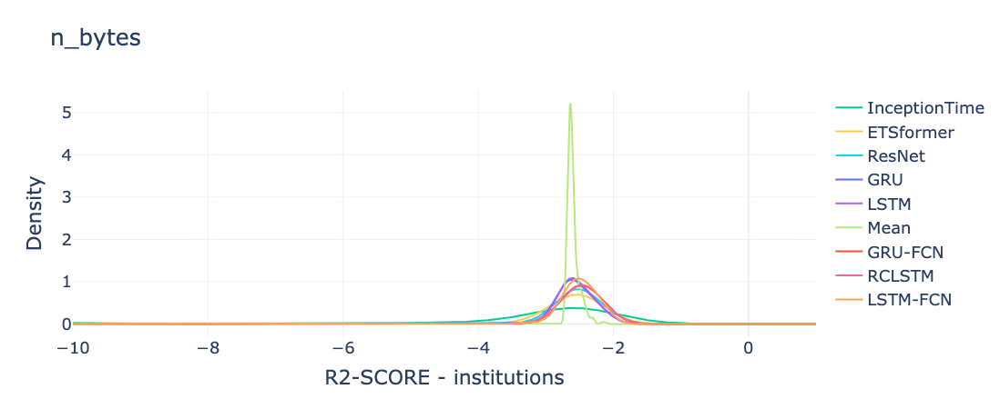

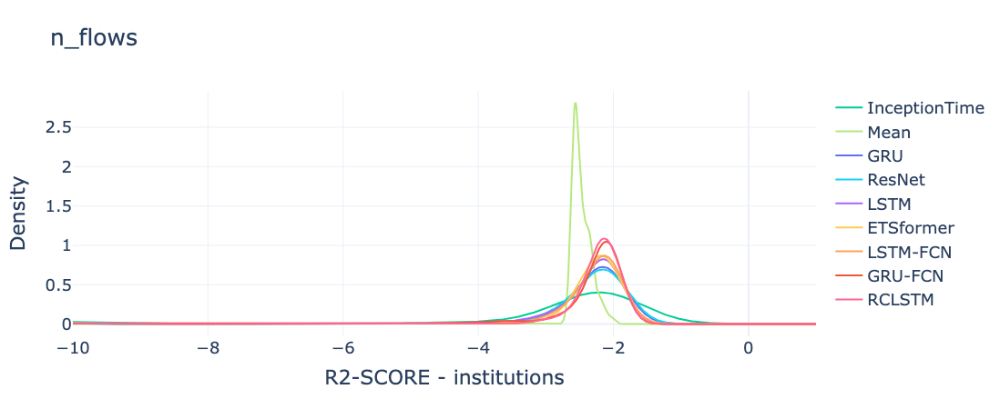

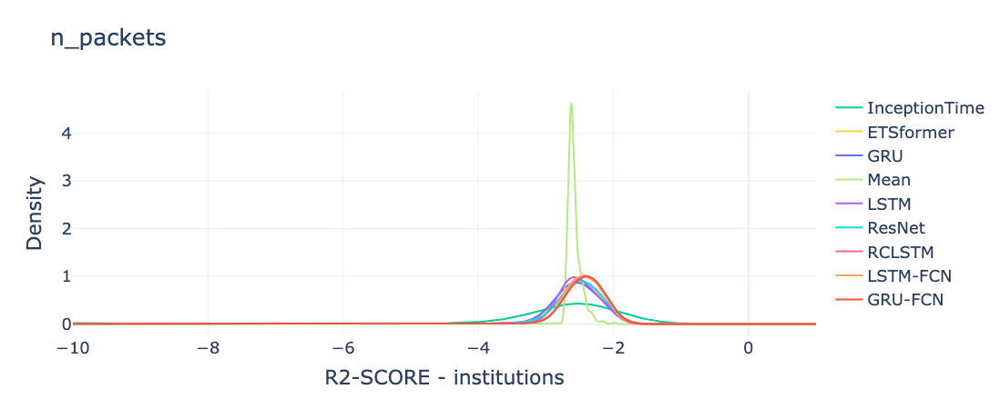

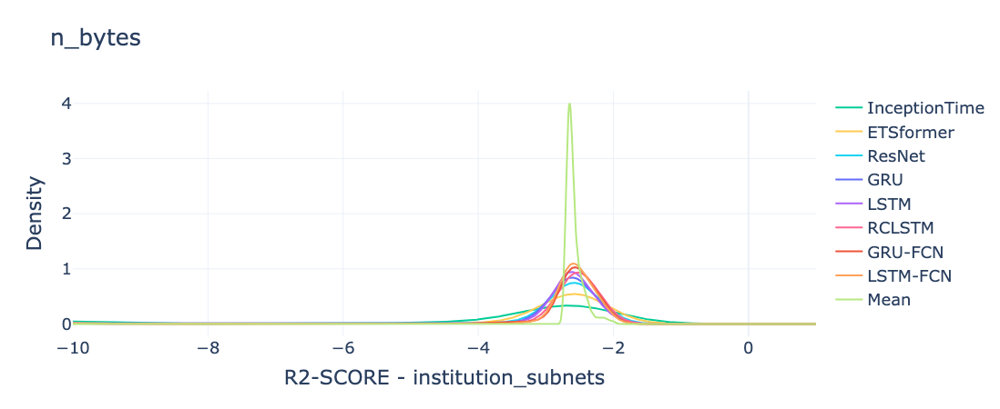

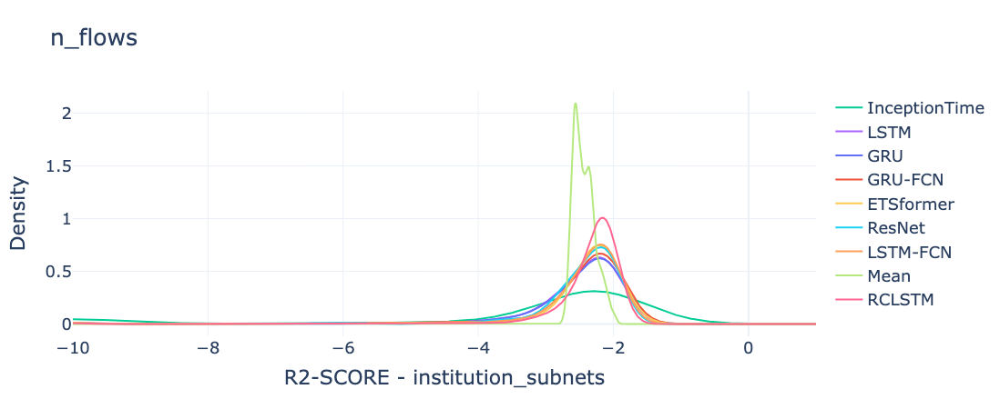

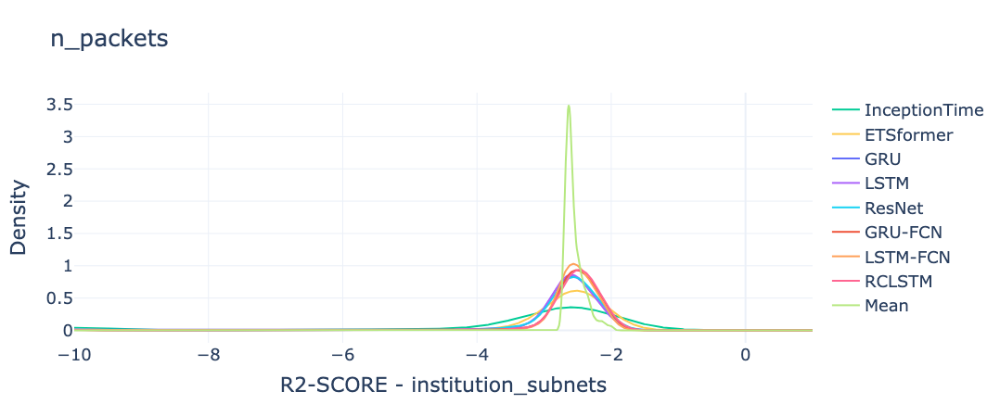

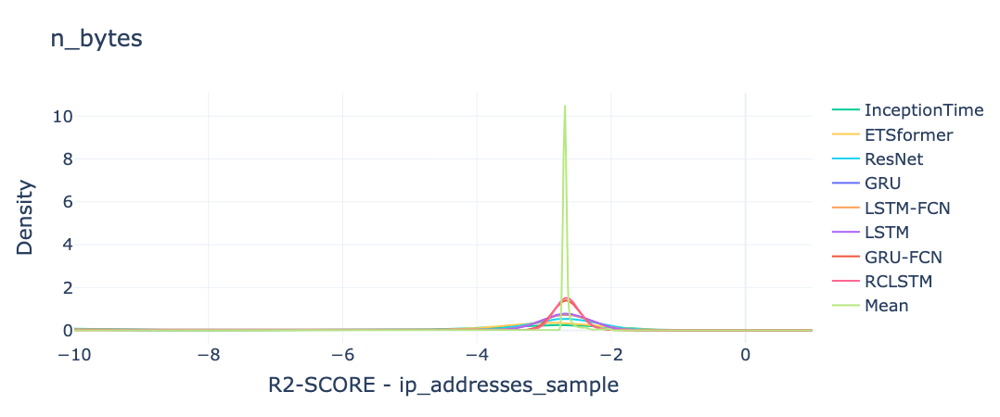

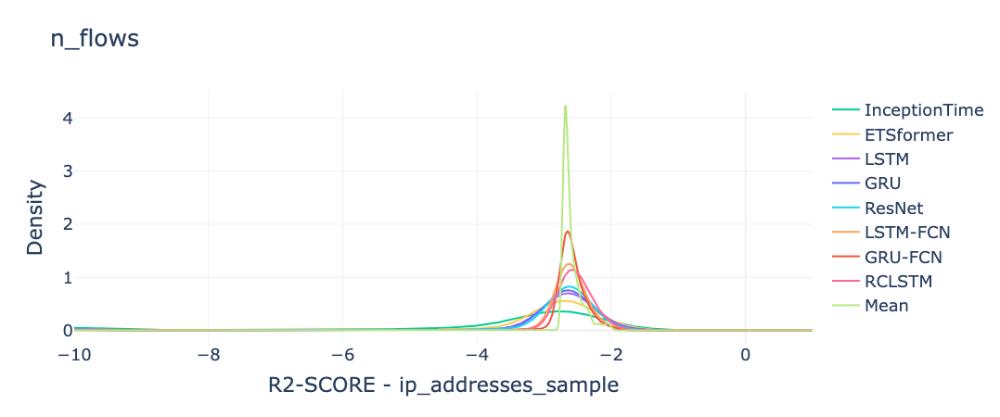

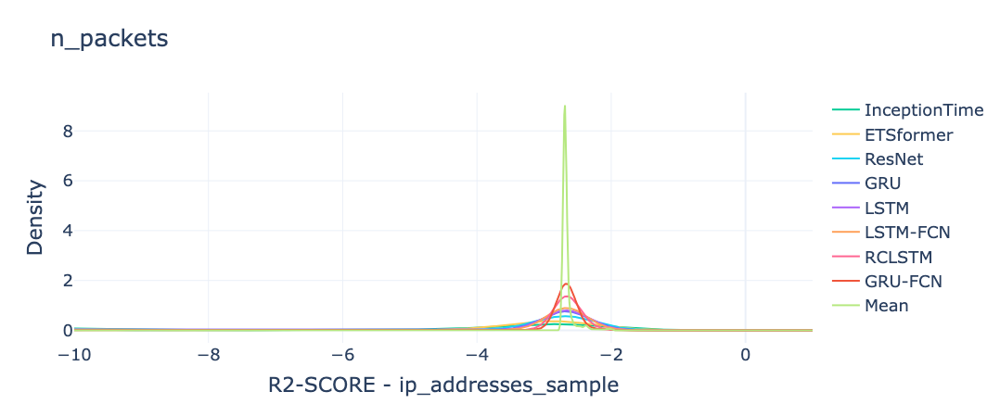

In [87]:
colormap = px.colors.qualitative.Plotly  # Predefined color sequence
identifier_to_color = {id_: colormap[i % len(colormap)] for i, id_ in enumerate(models)}
for subset, df_2 in df_dict_2.items():
    for column in column_subset:
    
        fig = go.Figure()
    
        mean_results = {}
        for model in models:
            tmp = df_2[(df_2['TS_METRIC'] == column) & (df_2['MODEL'] == model)]
            if tmp.shape[0] == 0:
                continue
            mean_results[model] = tmp[metric_for_eval].mean()
            
            
        for model in sorted(mean_results, key=lambda k: mean_results[k]):
            tmp = df_2[(df_2['TS_METRIC'] == column) & (df_2['MODEL'] == model)]
            if tmp.shape[0] == 0:
                continue
            
            kde = gaussian_kde(tmp[metric_for_eval].values)
            fig.add_trace(go.Scatter(
                    x=np.linspace(-10, 1, 1000),
                    y=kde(np.linspace(-10, 5, 1000)),
                    mode='lines',
                    name=f"{model}",
                    marker=dict(color=identifier_to_color[model], size=10),
                ))
        fig.update_layout(
                title=column,
                xaxis_title=f'{metric_for_eval} - {subset}',
                yaxis_title='Density',
                template='plotly_white',
                showlegend=True,
                font=dict(size=18),
                height=450
            )
    
        # Show the plot
        fig.show()


In [68]:
mapping = {"institutions": "ins",
           "institution_subnets": "subs",
           "ip_addresses_sample": "ips"}

def plot_kdes(ts_metric):
    i = 0
    fig, axs = plt.subplots(len(models) - 1, len(df_dict_2), figsize=(24,24))
    for subset, df_2 in df_dict_2.items(): 
        j = 0
        for model in models:
            if model == "lstmae":
                continue
            data = df_2[(df_2["TS_METRIC"] == ts_metric) & (df_2["MODEL"] == model)][metric_for_eval]
            log_data = np.log1p(data)

            axs[j][i].hist(log_data, bins=50, edgecolor='black')
            axs[j][i].set_title(f"{model} - {ts_metric} - {mapping[subset]}")
            axs[j][i].set_xlabel(metric_for_eval)
            j += 1
        i += 1
            

    plt.tight_layout()
    plt.show()

### n_bytes - The number of bytes

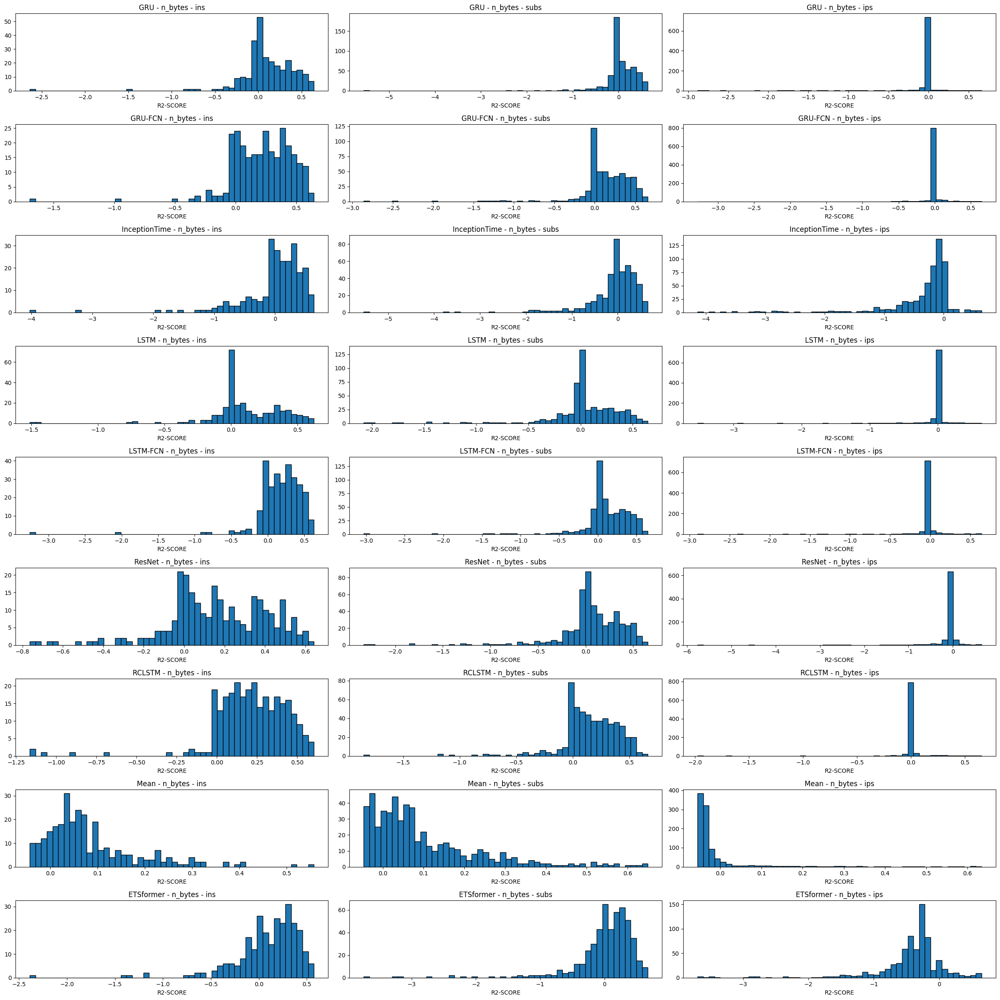

In [69]:
plot_kdes("n_bytes")

### n_flows - The number of flows

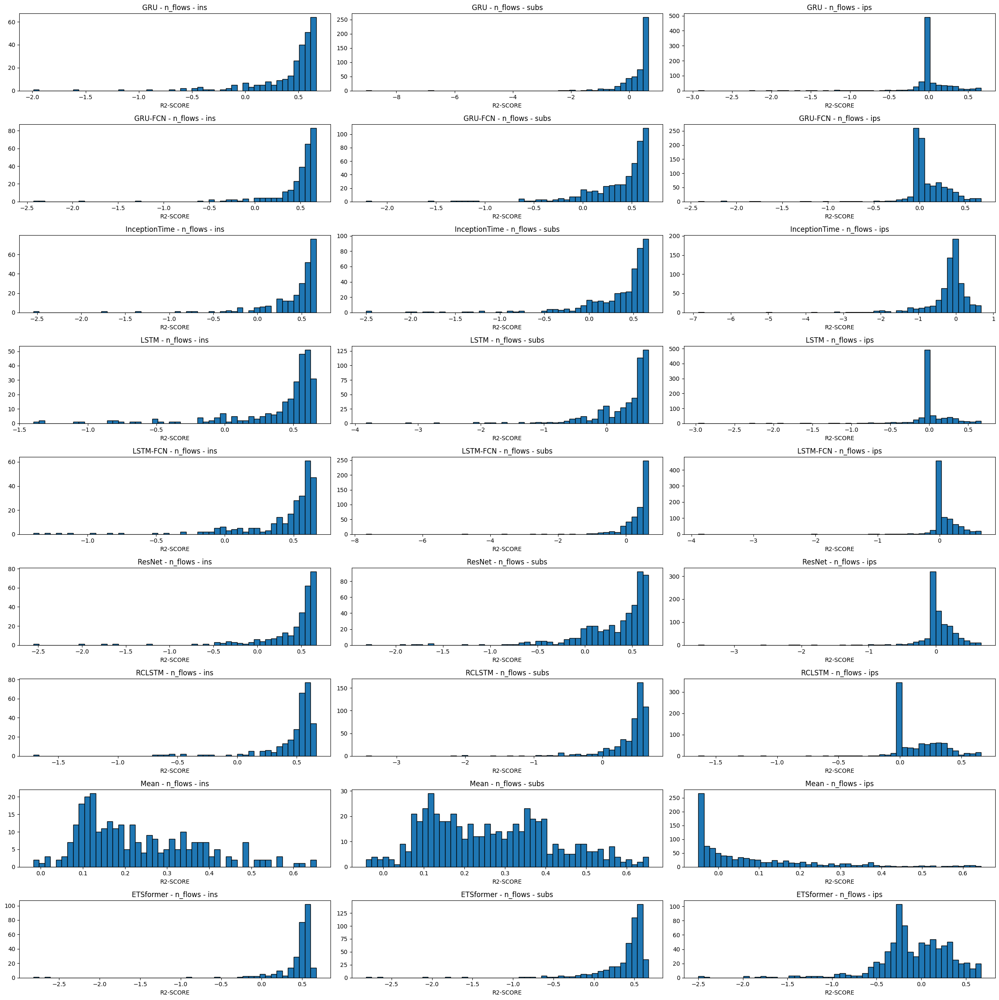

In [70]:
plot_kdes("n_flows")

### n_packets - The number of packets

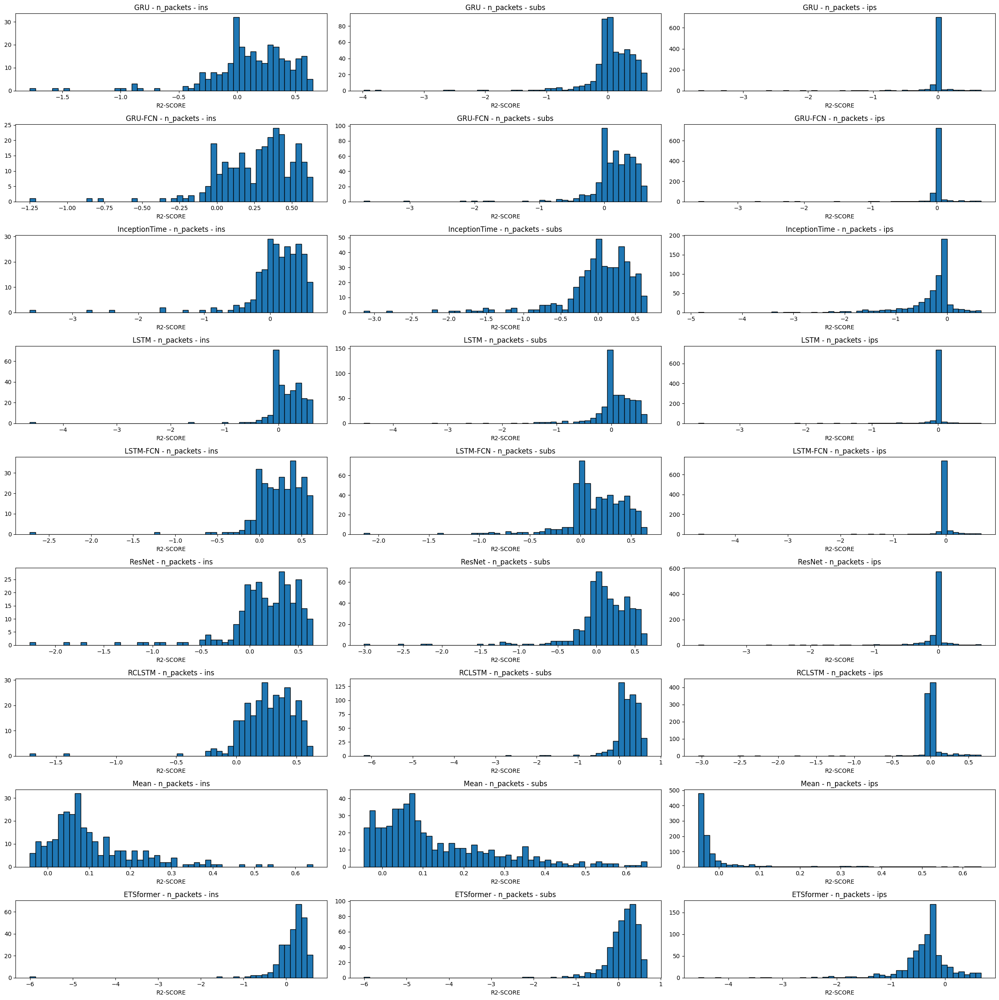

In [71]:
plot_kdes("n_packets")

### tcp_udp_ratio_packets - The TCP/UDP packet ratio

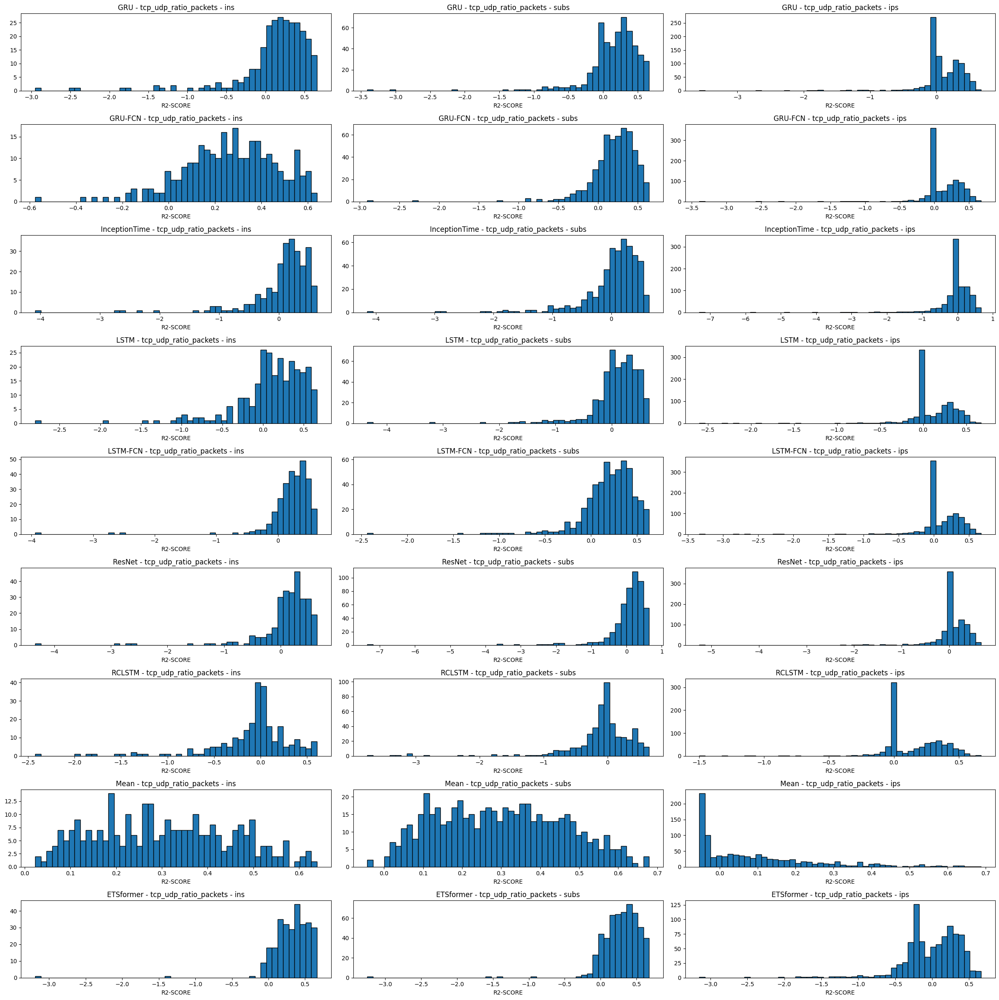

In [72]:
plot_kdes("tcp_udp_ratio_packets")

### tcp_udp_ratio_bytes - The TCP/UDP bytes ratio

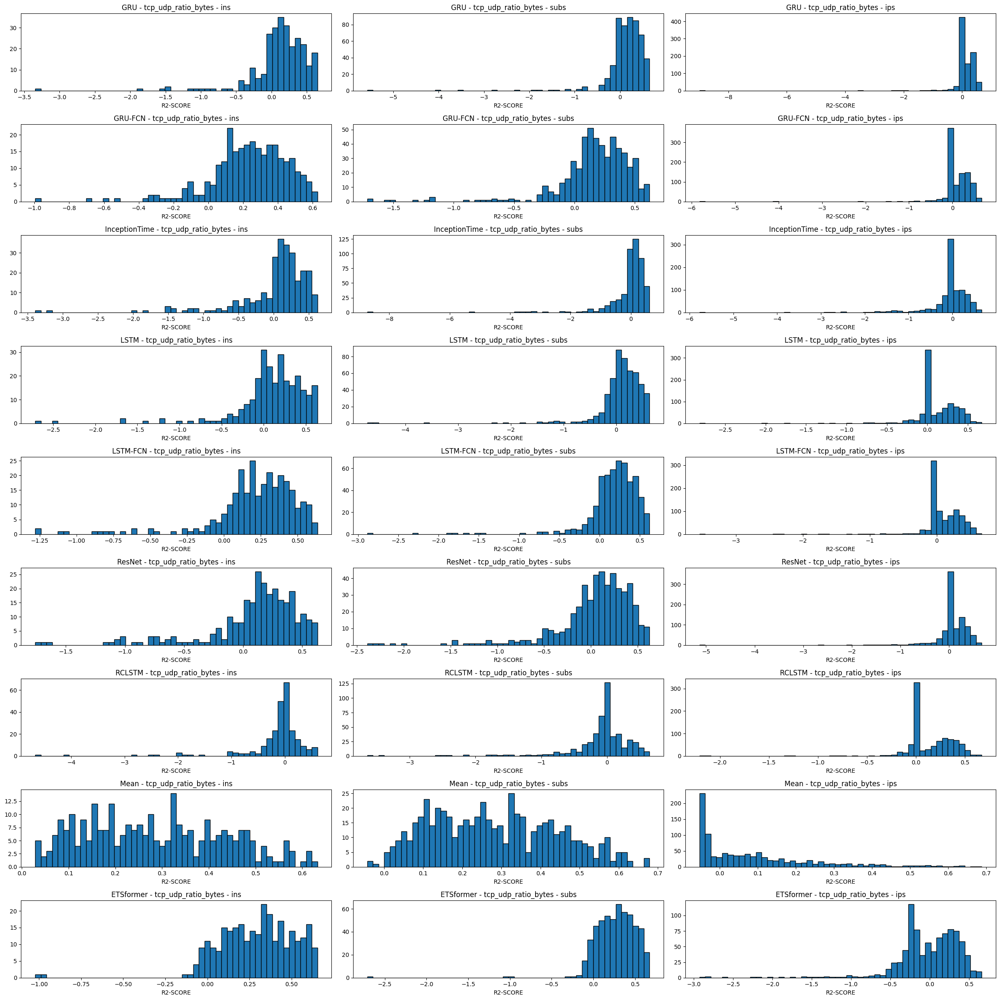

In [73]:
plot_kdes("tcp_udp_ratio_bytes")

### dir_ratio_packets - The directional ratio of packets

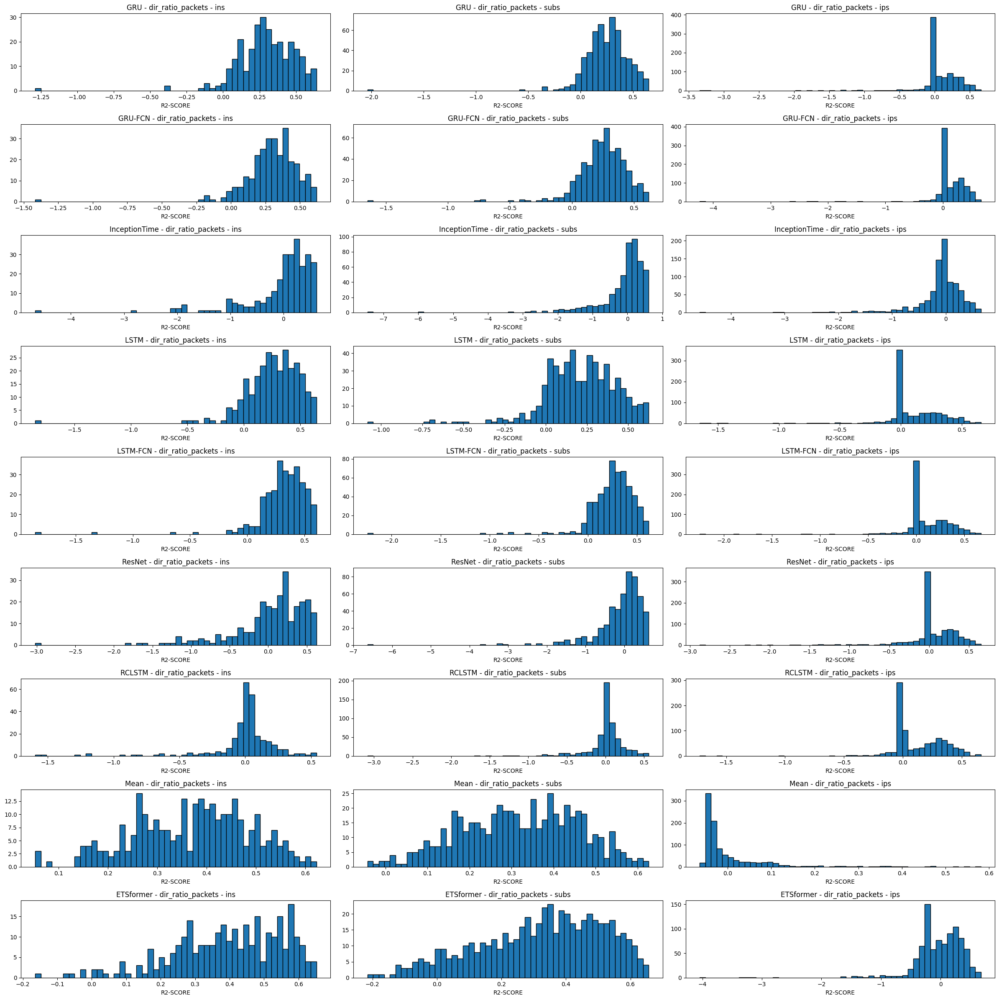

In [74]:
plot_kdes("dir_ratio_packets")

### dir_ratio_bytes - The directional ratio of bytes

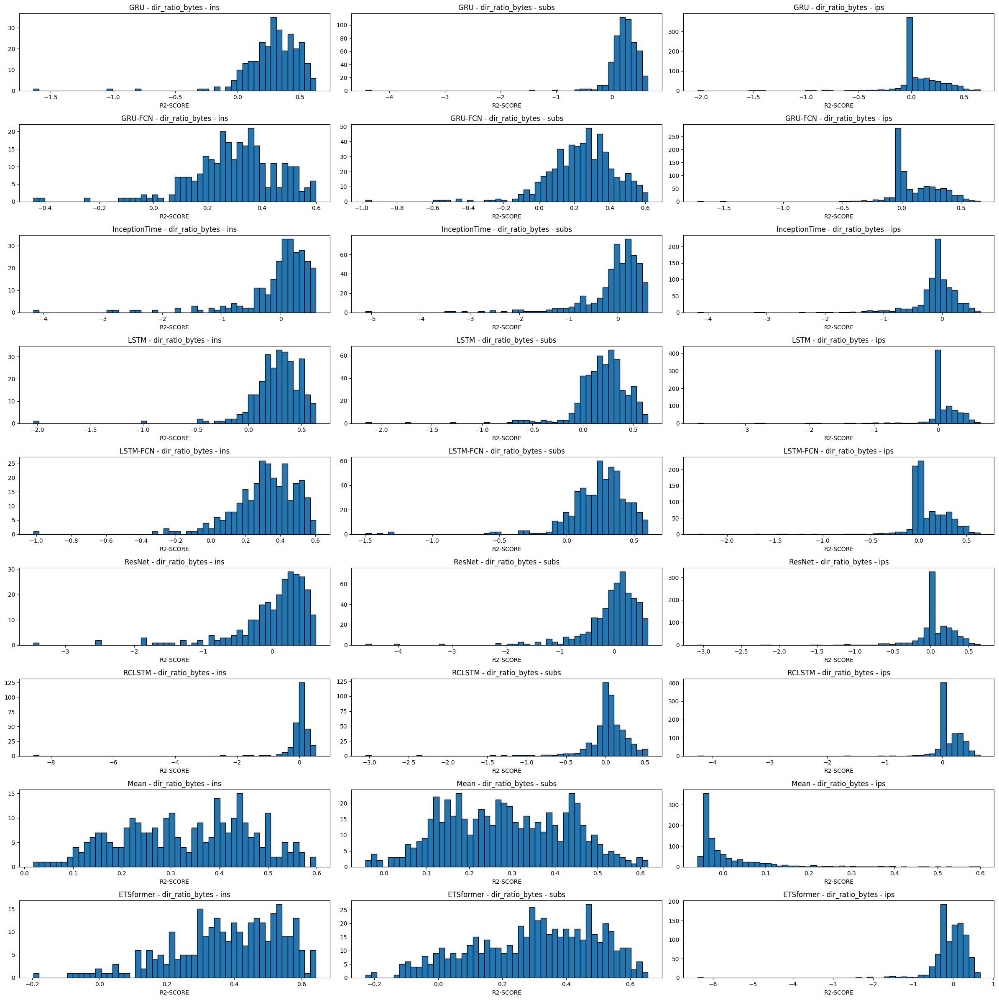

In [75]:
plot_kdes("dir_ratio_bytes")

### avg_ttl - The average TTL

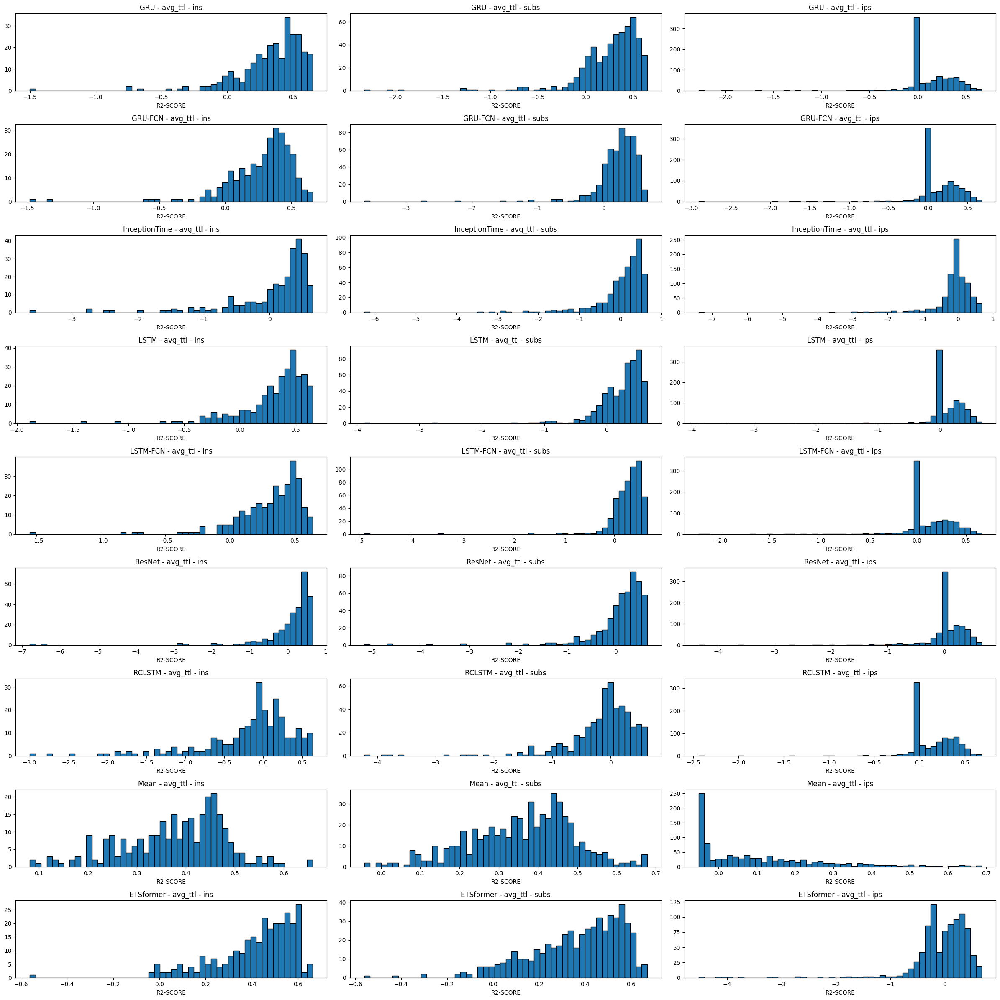

In [76]:
plot_kdes("avg_ttl")

### avg_duration - The average duration

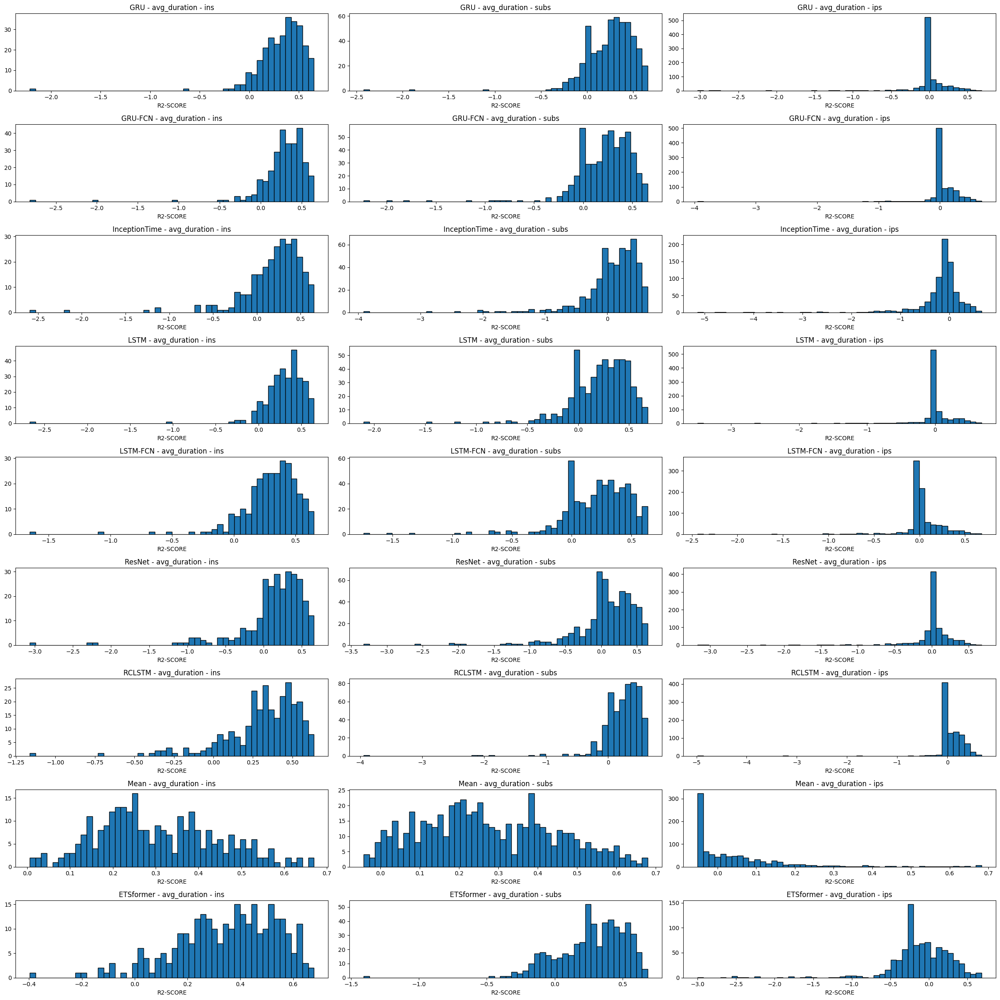

In [77]:
plot_kdes("avg_duration")

### average_n_dest_asn - Average of the number of unique destination ASNs

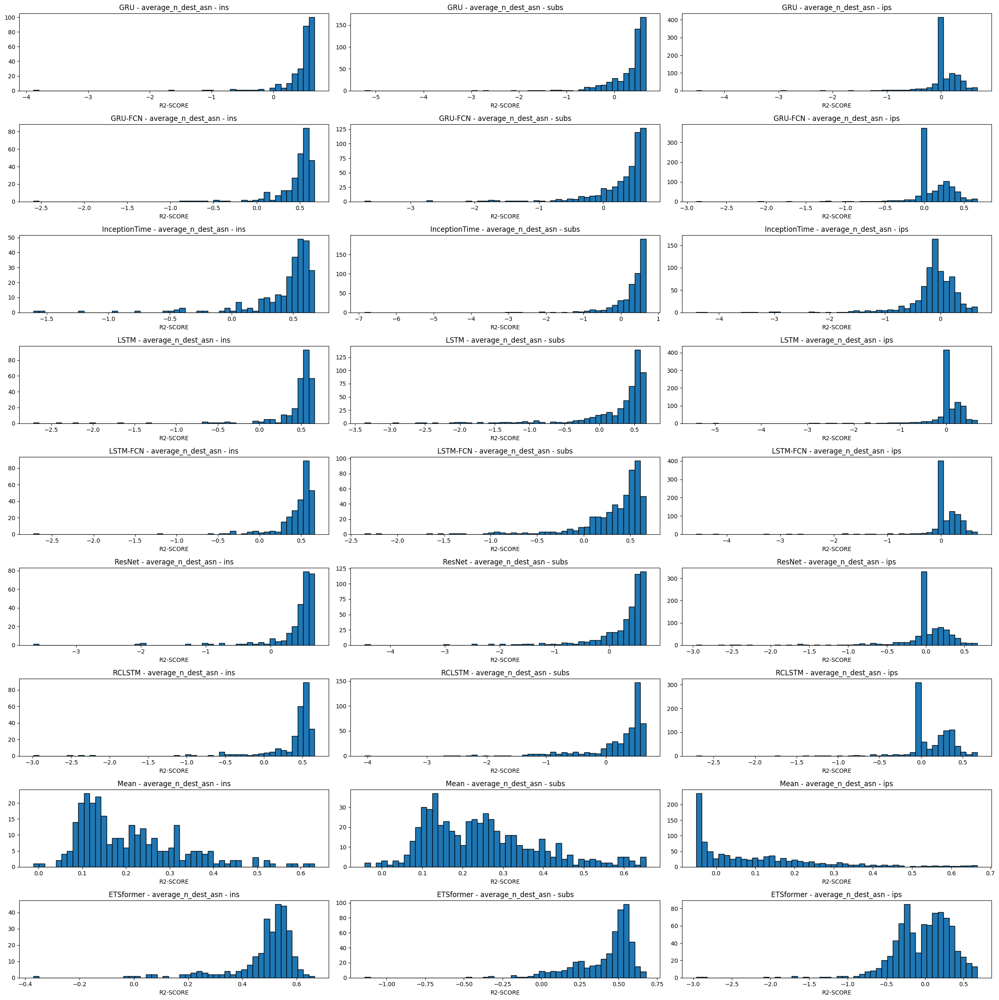

In [78]:
plot_kdes("average_n_dest_asn")

### average_n_dest_ip - Average of the number of unique destination ASNs

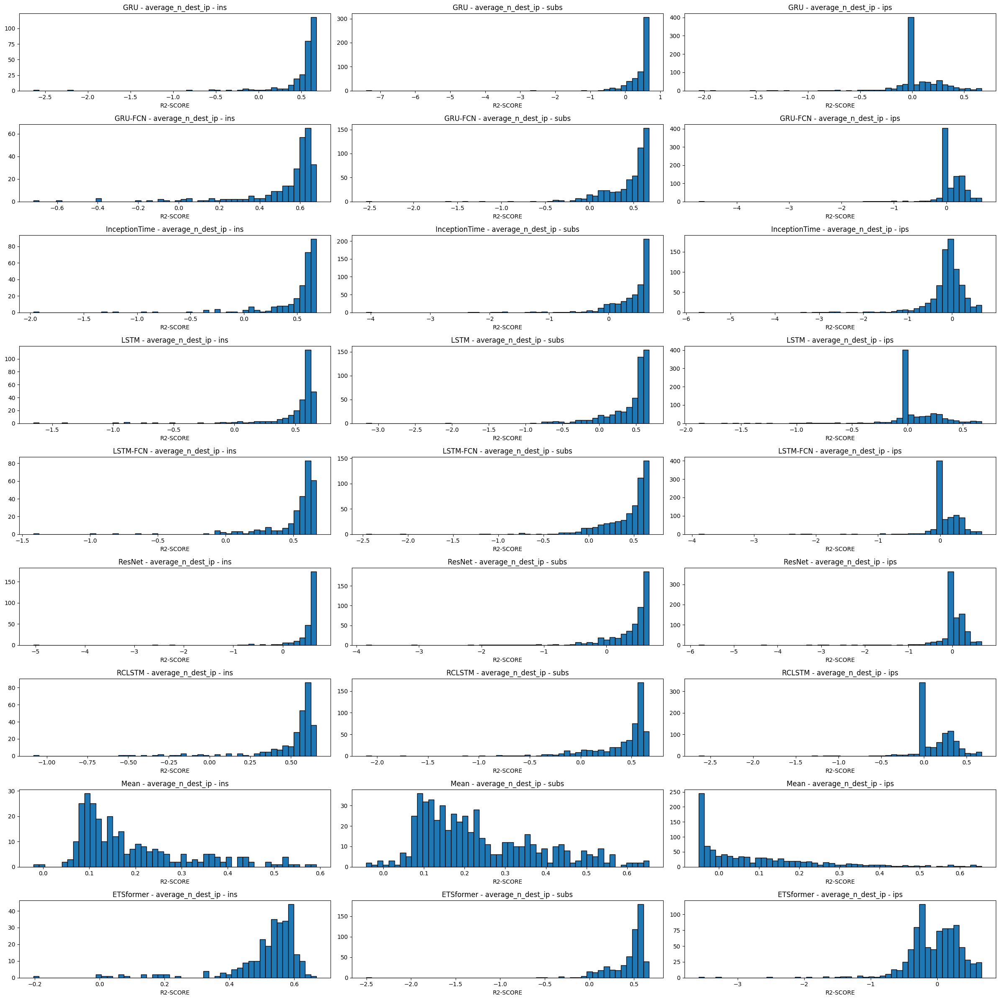

In [79]:
plot_kdes("average_n_dest_ip")

### average_n_dest_ports - Average of the number of unique destination ports

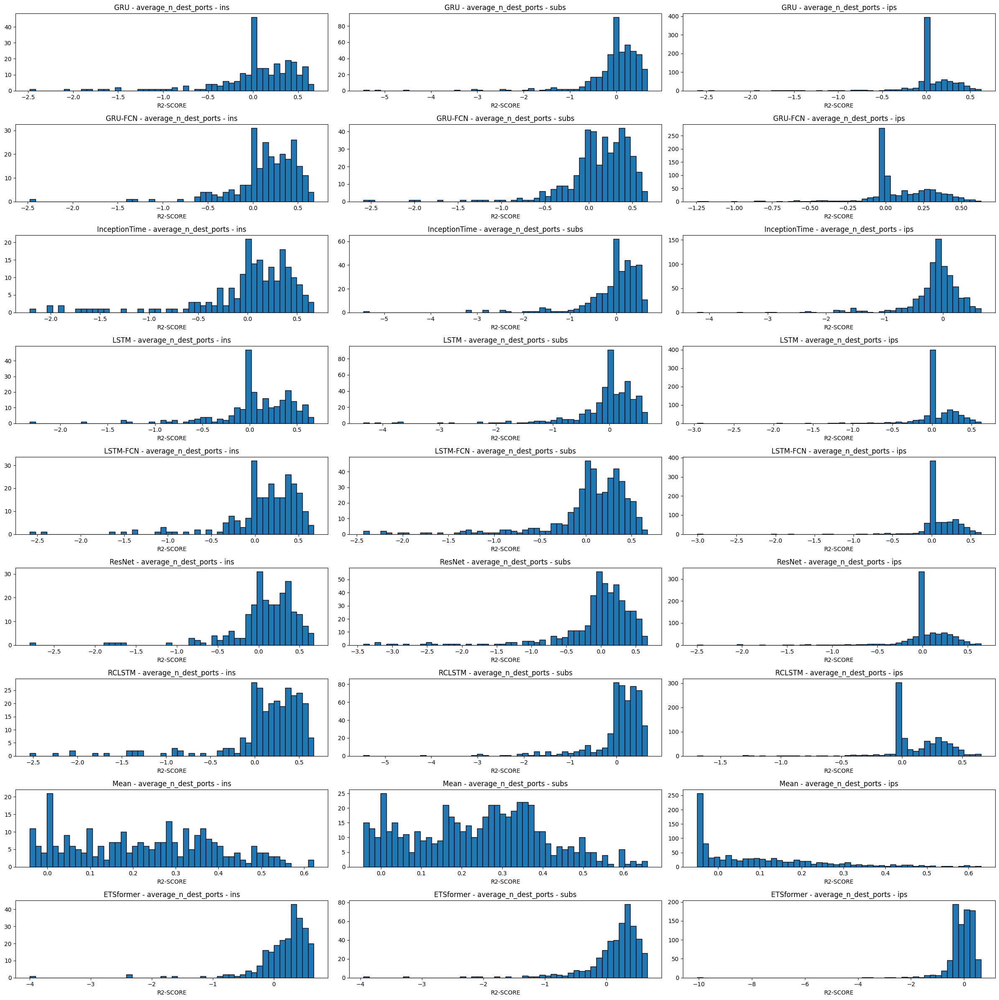

In [80]:
plot_kdes("average_n_dest_ports")

### std_n_dest_asn - Standard deviation of the number of unique destination ASNs

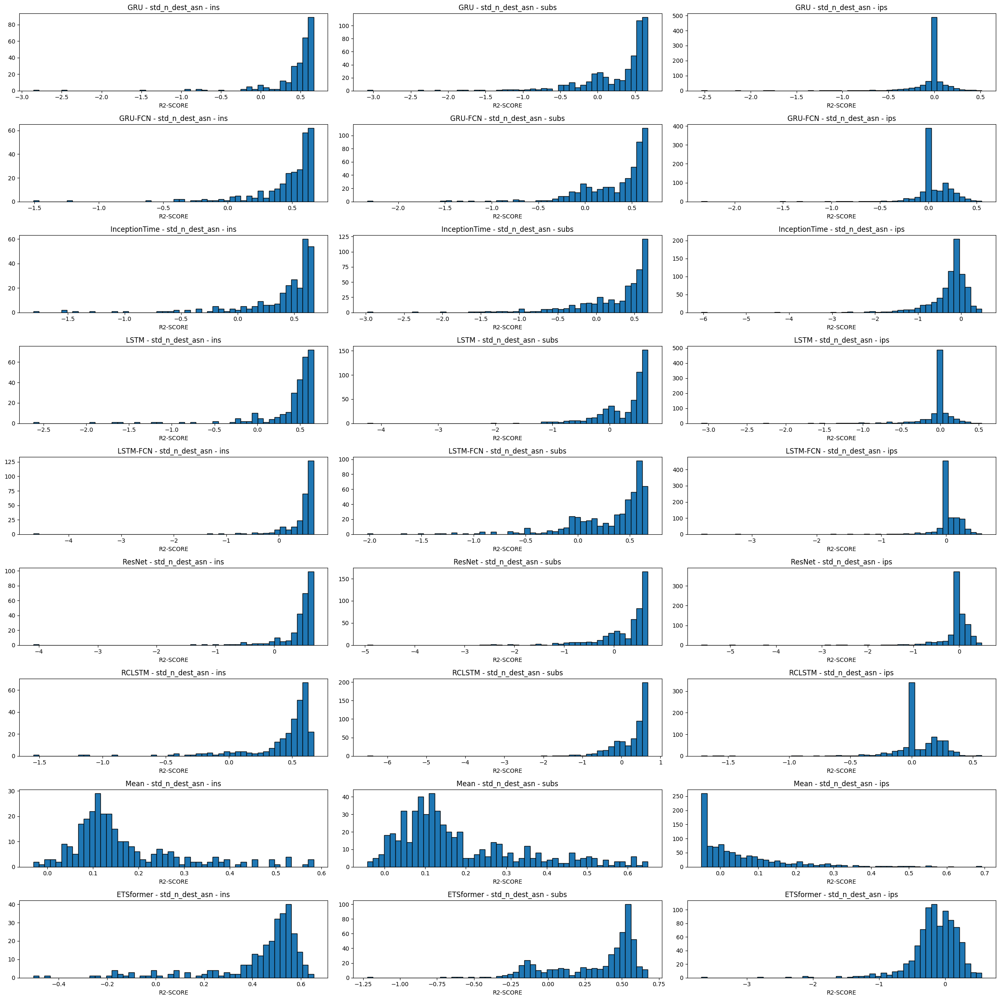

In [81]:
plot_kdes("std_n_dest_asn")

### std_n_dest_ip - Standard deviation of the number of unique destination ASNs

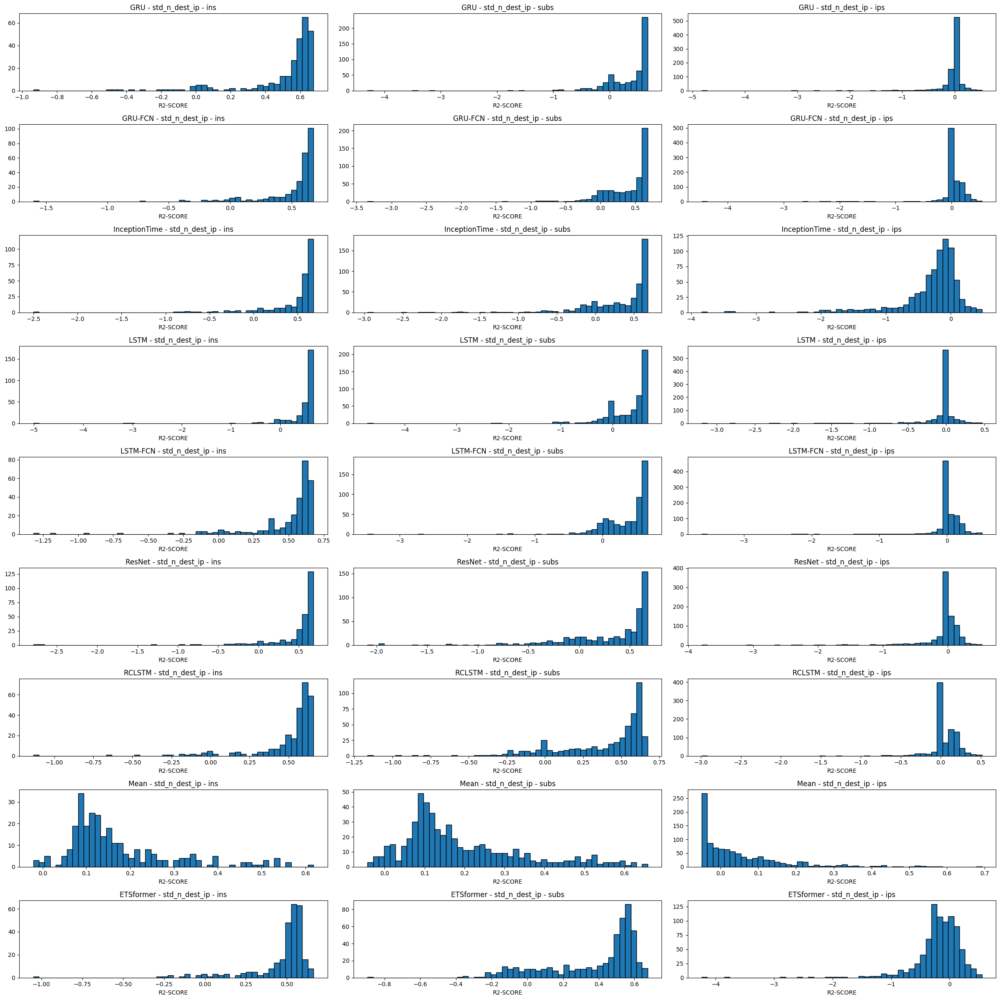

In [82]:
plot_kdes("std_n_dest_ip")

### std_n_dest_ports - Standard deviation of the number of unique destination ports

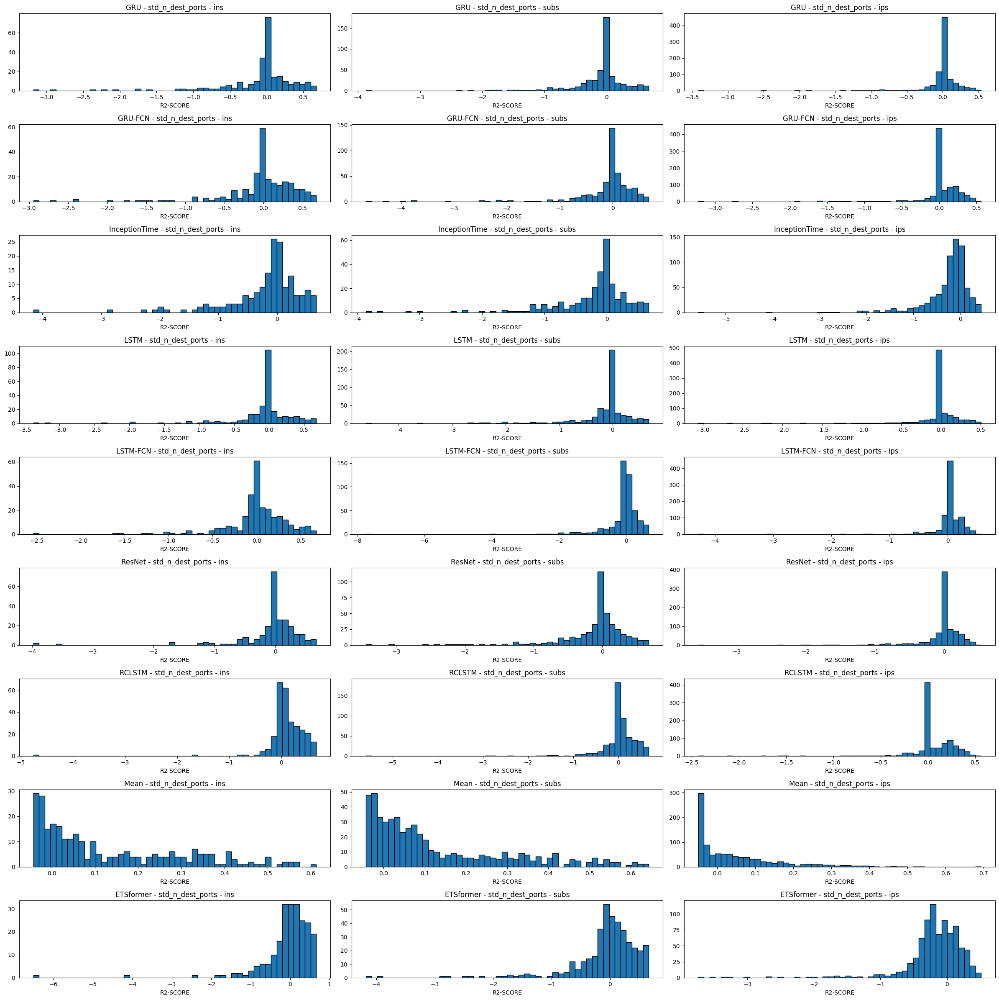

In [83]:
plot_kdes("std_n_dest_ports")

### sum_n_dest_asn - Sum of the number of unique destination ASNs

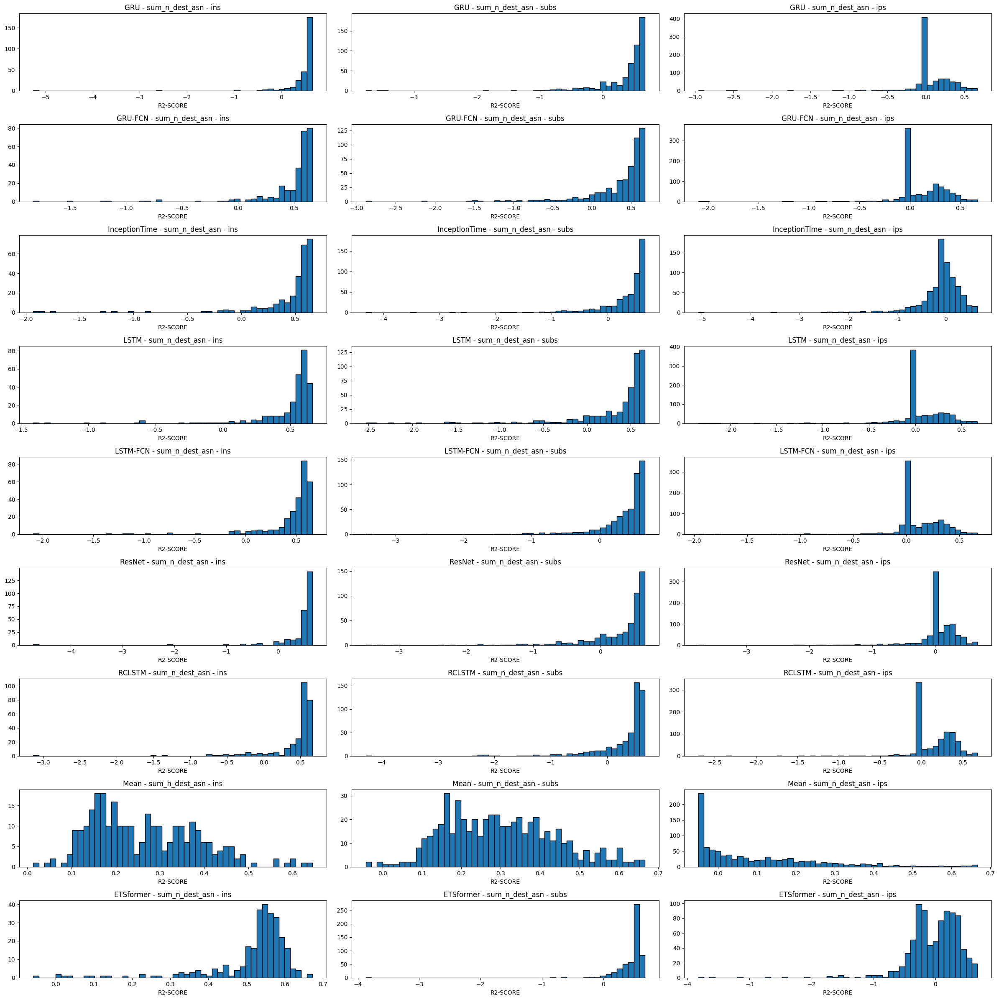

In [84]:
plot_kdes("sum_n_dest_asn")

### sum_n_dest_ip - Sum of the number of unique destination ASNs

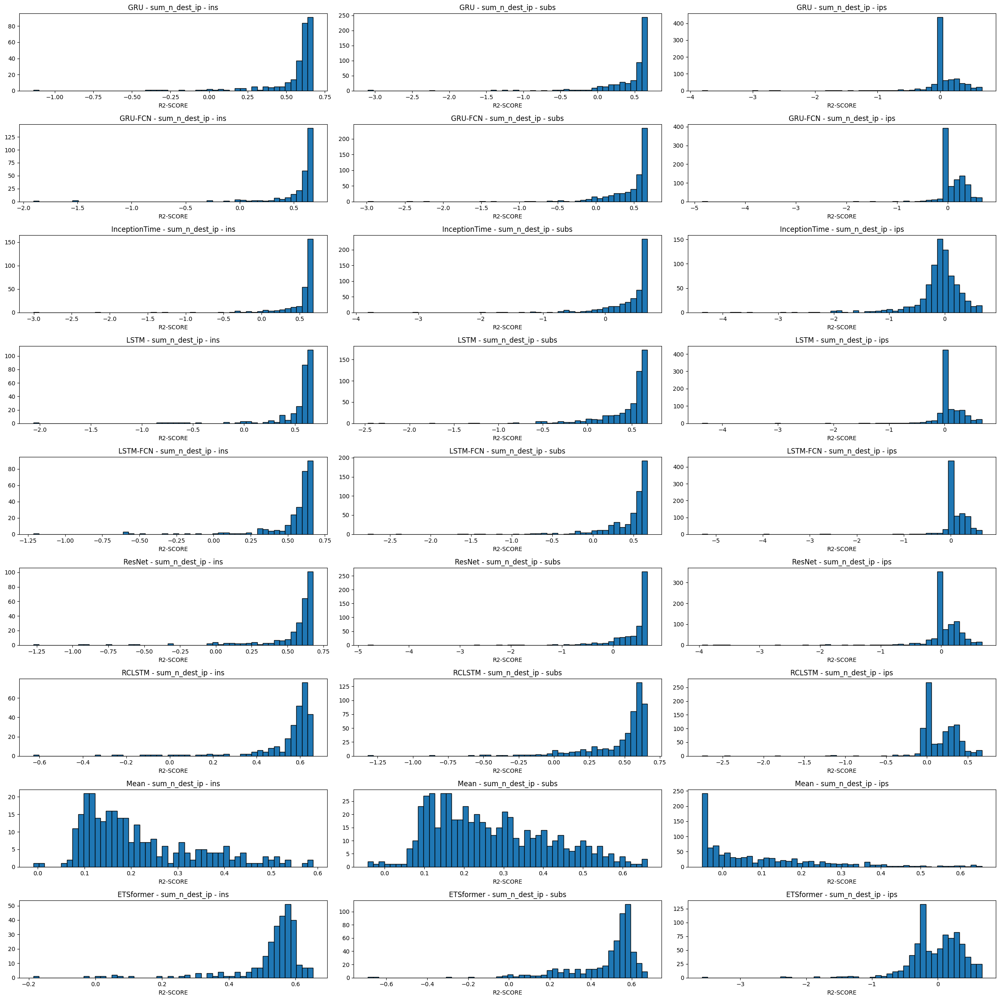

In [85]:
plot_kdes("sum_n_dest_ip")

### sum_n_dest_ports - Sum of the number of unique destination ports

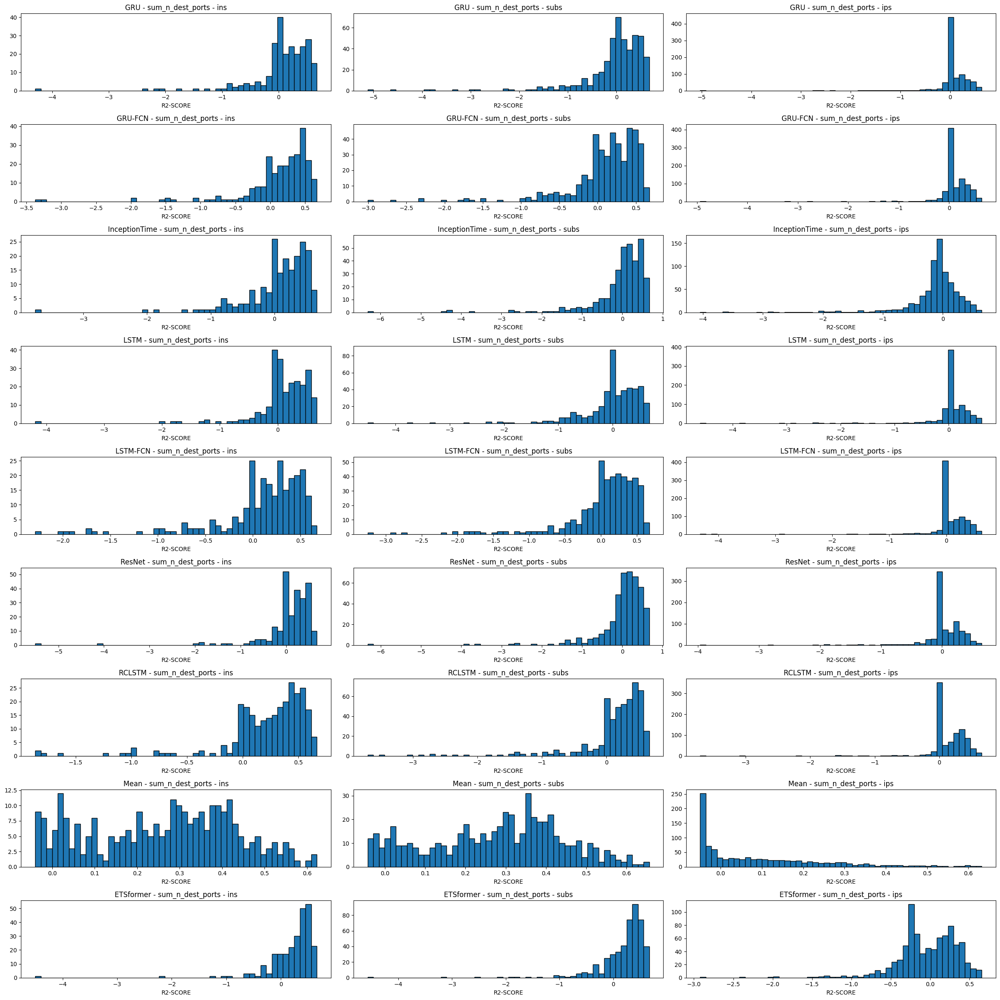

In [86]:
plot_kdes("sum_n_dest_ports")